# Source code

In [1]:
%load_ext autoreload
%aimport cbc_dp, cbc
import matplotlib
import numpy as np
import pickle
from numpy import ma
import h5py
import matplotlib.pyplot as plt
import pyqtgraph as pg
from scipy.ndimage.filters import median_filter, gaussian_filter
from scipy.ndimage.measurements import label, maximum_position, center_of_mass
from scipy import constants
import matplotlib.colors as colors
from mpl_toolkits.mplot3d import Axes3D
from scipy.optimize import differential_evolution, minimize

In [2]:
peaks_path = "exp_results/scan_{0:05}/scan_peaks_{0:05}.h5"
cor_path = "exp_results/scan_{0:05}/scan_corrected_{0:05}.h5"
bgd_path = 'corrected_data/background'
cor_data_path = 'corrected_data/corrected_data'
strks_path = 'corrected_data/streaks_data'
data_path = 'data/data'
mask_path = 'data/mask'
lines_path = 'peaks_data/bragg_lines'
ints_path = 'peaks_data/bragg_intensities'
pupil_size = np.radians([0.74, 1.6])
pix_size = 75 * 1e-3
wavelength = constants.h * constants.c / 17000 / constants.e * 1e3
rot_axis = np.array([0, 1, 0])
b12_sizes = np.array([16.18, 21.23, 24.33]) * 1e-7
b12_rec_sizes = b12_sizes**-1 * wavelength
b12_det_pos = np.array([1470 * pix_size, 1710 * pix_size, 101.976])
lys_det_pos = np.array([1480 * pix_size, 1155 * pix_size, 150.0])
b12_exp = cbc_dp.ExperimentSettings(axis=rot_axis,
                                    pix_size=pix_size,
                                    det_pos=b12_det_pos,
                                    wavelength=wavelength)
lys_exp = cbc_dp.ExperimentSettings(axis=rot_axis,
                                    pix_size=pix_size,
                                    det_pos=lys_det_pos,
                                    wavelength=wavelength)

In [3]:
f135 = h5py.File(cor_path.format(135), 'r')
b12_cor_data = f135[cor_data_path]
b12_data = f135[data_path]
b12_mask = f135[mask_path][:]
b12_bgd = f135[bgd_path]
b12_strks_data = f135[strks_path][:]

In [5]:
f107 = h5py.File(cor_path.format(107), 'r')
lys_cor_data = f107[cor_data_path]
lys_bgd = f107[bgd_path]
lys_strks_data = f107[strks_path][:]

In [8]:
f133 = h5py.File(cor_path.format(133), 'r')
b12_cor_data2 = f133[cor_data_path]
b12_bgd2 = f133[bgd_path]
b12_strks_data2 = f133[strks_path][:]

# Line detection

In [6]:
b12_scan = pickle.load(open('exp_results/b12_scan.p', 'rb'))
strks = b12_strks_data[0]
image = b12_cor_data[0]
nms = cbc_dp.utils.nonmax_supression(strks.astype(np.float))
hough_det = cbc_dp.LineSegmentDetector()
lsd = cbc_dp.LineSegmentDetector(sigma_scale=0.2, scale=0.9)
lsd.det_frame(strks, b12_exp).size, b12_scan[0].size

(101, 90)

In [7]:
strks_list = []
strks_list.append(hough_det.det_frame(strks, b12_exp))
strks_list.append(hough_det.det_frame(nms, b12_exp))
strks_list.append(lsd.det_frame(strks, b12_exp))
strks_list.append(lsd.det_frame(nms, b12_exp))
pts_list = [strks.index_pts() for strks in strks_list]

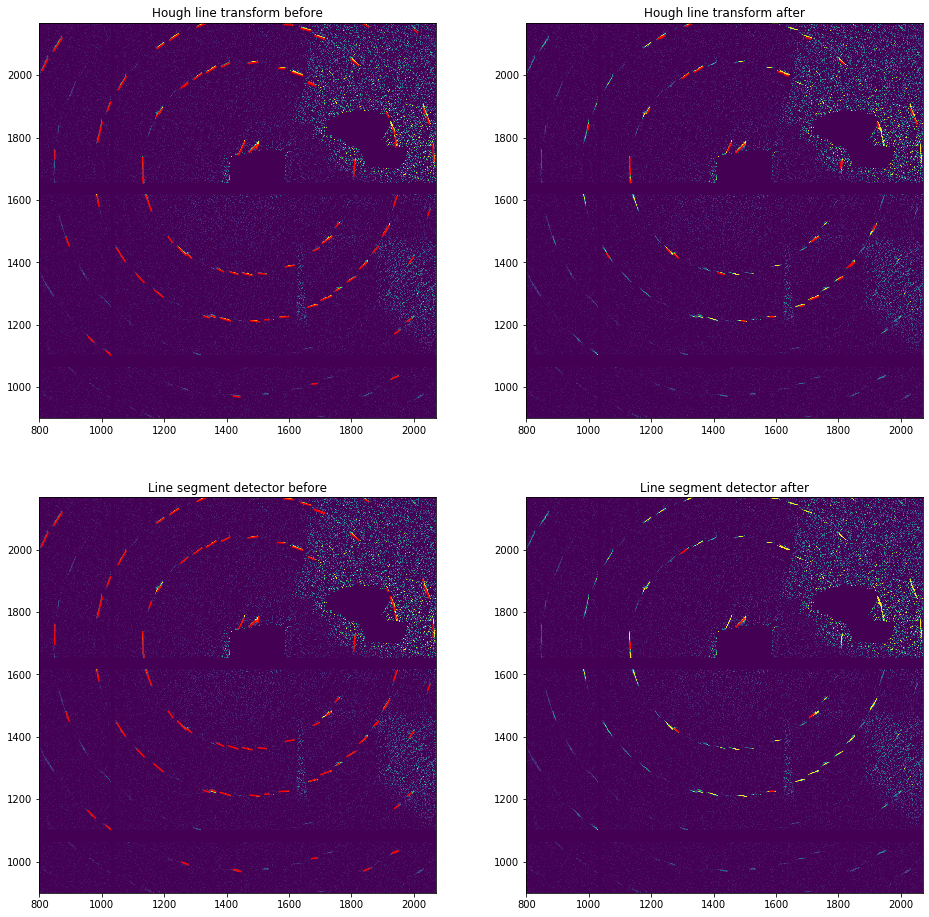

In [8]:
%matplotlib inline
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
titles = ['Hough line transform before', 'Hough line transform after', 'Line segment detector before', 'Line segment detector after']
for ax, lines, pts, title in zip(axes.ravel(), strks_list, pts_list, titles):
    ax.imshow(image, vmin=0, vmax=100)
    for line in lines:
        ax.plot(line[:, 0], line[:, 1], 'r')  
    ax.scatter(pts[:, 0], pts[:, 1])
    ax.set_xlim(800, 2070)
    ax.set_ylim(900, 2167)
    ax.set_title(title)
plt.show()

# Indexing

In [9]:
lsd = cbc_dp.LineSegmentDetector()
thetas = np.radians(np.arange(101))
b12_scan = lsd.det_scan(b12_strks_data, b12_exp)

In [230]:
b12_qs = b12_scan.kout_ref(theta=thetas)
basis_full = b12_qs.index()
or_mat_full = cbc.rec_or_mat(basis_full)

In [247]:
frame_idx = 80
qs_frame = b12_scan[frame_idx].kout(theta=0)
basis_frame = qs_frame.index()
or_mat_frame = cbc.rec_or_mat(basis_frame)
model_frame = cbc_dp.CircModel(cbc_dp.RecLattice(or_mat_frame), np.radians(1.), 0.4)
det_pts_frame = model_frame.det_pts(b12_exp)

rot_m = b12_exp.rotation_matrix(np.radians(-frame_idx))
or_rot = or_mat_full.dot(rot_m.T)
model = cbc_dp.CircModel(cbc_dp.RecLattice(or_rot), np.radians(1.), 0.4)
det_pts_full = model.det_pts(b12_exp)

In [17]:
%gui qt
app = cbc_dp.Qt.make_app()
w = cbc_dp.Qt.ScatterViewer()
w.set_data(pos=b12_qs.scat_vec, size=3)
w.show()

In [32]:
%gui qt
app = cbc_dp.Qt.make_app()
w = cbc_dp.Qt.VolumeViewer()
w.set_data(data=cbc_dp.Qt.vol_data(fft_crop))
w.show()

In [33]:
%gui qt
app = cbc_dp.Qt.make_app()
w = cbc_dp.Qt.ScatterViewer()
w.set_data(pos=peaks, size=10)
w.show()

In [232]:
%gui qt
app = cbc_dp.Qt.make_app()
w = cbc_dp.Qt.ScatterViewer()
w.set_data(pos=np.concatenate((basis, np.zeros((1, 3)))), size=10)
w.show()

In [243]:
b12_axes = np.array([[16.18, 0, 0],
                     [0, 21.23, 0],
                     [0, 0, 24.33]]) * 1e-7
for ax, b12_ax in zip(basis_full, b12_axes):
    print(np.sqrt(ax.dot(ax))**-1, wavelength / np.sqrt(b12_ax.dot(b12_ax)), sep='\t')

0.0466739501461924	0.0450753280725686
0.03218772842386179	0.03435321753246161
0.025726631078361272	0.029976112133750923


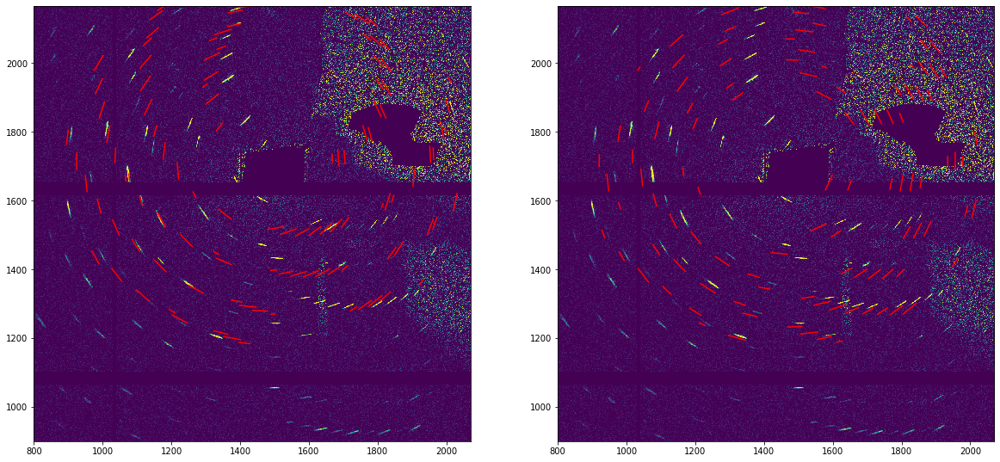

In [248]:
%matplotlib inline
fig, plt_axes = plt.subplots(1, 2, figsize=(20, 10))
for ax in plt_axes:
    ax.imshow(b12_cor_data[frame_idx], vmin=0, vmax=50)
    ax.set_xlim(800, 2070)
    ax.set_ylim(900, 2167)
for line in det_pts_full:
    plt_axes[0].plot(line[:, 0], line[:, 1], 'r')
for line in det_pts_frame:
    plt_axes[1].plot(line[:, 0], line[:, 1], 'r')
plt.show()

In [42]:
frame_idxs = [80, 90]
or_mat = cbc.rec_or(exp_axes)
pts_list, sim_masks, exp_masks = [], [], []
hkls_sim, hkls_exp = [], []
for frame_idx in frame_idxs:
    rot_m = b12_exp.rotation_matrix(np.radians(-frame_idx))
    or_rot = or_mat.dot(rot_m.T)
    rec_lat = cbc_dp.RecLattice(or_rot, center=np.zeros(3))
    model = cbc_dp.CircModel(rec_lat=rec_lat, num_ap=np.radians(1.), q_max=0.4)
    pts_list.append(model.det_pts(b12_exp))
    idxs = slice(b12_scan.shapes[frame_idx], b12_scan.shapes[frame_idx + 1])
    hkl_exp = rec_lat.hkl_idx(b12_qs.scat_vec).astype(np.int)[idxs]
    hkl_sim = model.hkl_idx.astype(np.int)
    mask = (hkl_exp[:, None] == hkl_sim[None, :]).all(axis=2)
    hkls_sim.append(hkl_sim)
    hkls_exp.append(hkl_exp)
    sim_masks.append(mask.any(axis=0))
    exp_masks.append(mask.any(axis=1))

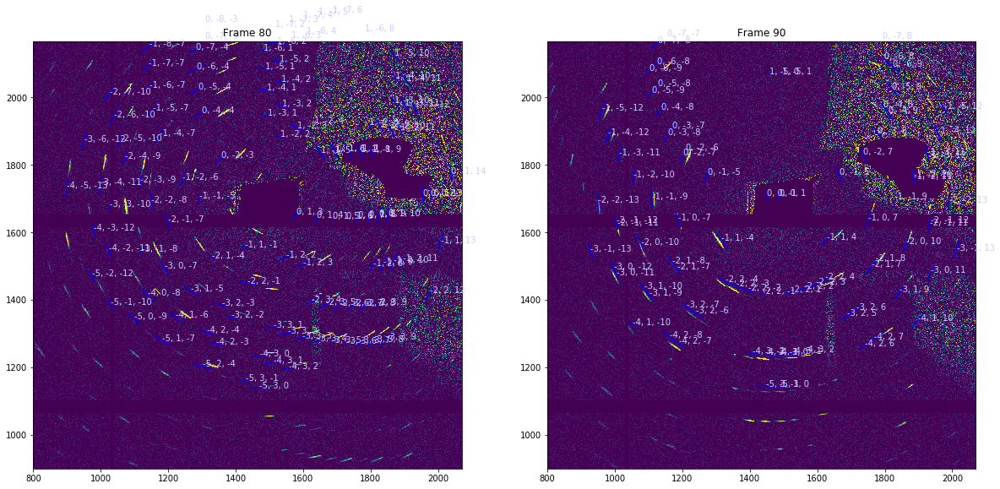

In [43]:
%matplotlib inline
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
for ax, det_pts, idx, hkl_sim, hkl_exp in zip(axes, pts_list, frame_idxs, hkls_sim, hkls_exp):
    for line, hkl in zip(b12_scan[idx].raw_lines, hkl_exp):
        ax.plot(line[:, 0], line[:, 1], 'r')
        ax.text(line[:, 0].mean(),
                line[:, 1].mean(),
                '{0[0]:d}, {0[1]:d}, {0[2]:d}'.format(hkl),
                color=(1, 0.8, 0.8))
    for line, hkl in zip(det_pts, hkl_sim):
        ax.plot(line[:, 0], line[:, 1], 'b')
        ax.text(line[:, 0].mean(),
                line[:, 1].mean(),
                '{0[0]:d}, {0[1]:d}, {0[2]:d}'.format(hkl),
                color=(0.8, 0.8, 1))
    ax.imshow(b12_cor_data[idx], vmin=0, vmax=50)
    ax.set_xlim(800, 2070)
    ax.set_ylim(900, 2167)
    ax.set_title('Frame {:d}'.format(idx))
plt.show()

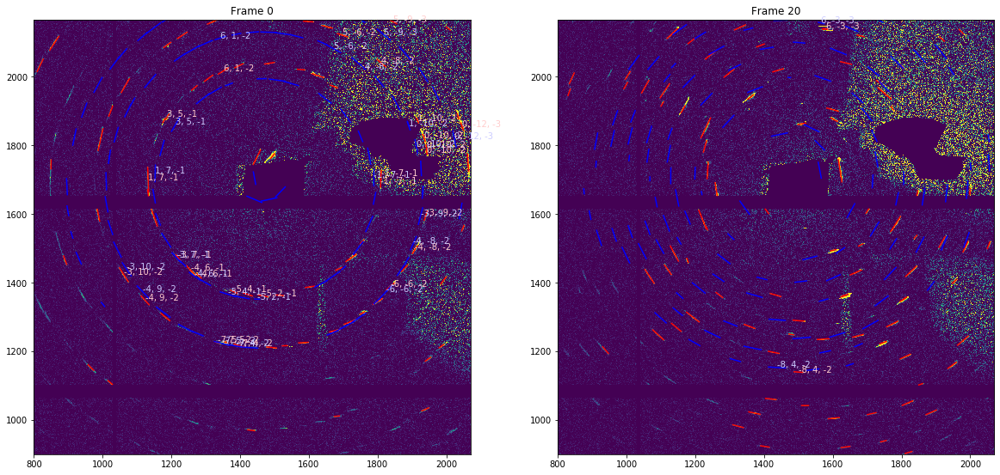

In [18]:
%matplotlib inline
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
for ax, det_pts, idx, hkl_sim, hkl_exp, sim_mask, exp_mask in zip(axes, pts_list, frame_idxs, hkls_sim,
                                                                  hkls_exp, sim_masks, exp_masks):
    for line, hkl, flag in zip(b12_scan[idx].raw_lines, hkl_exp, exp_mask):
        ax.plot(line[:, 0], line[:, 1], 'r')
        if flag:
            ax.text(line[:, 0].mean(),
                    line[:, 1].mean(),
                    '{0[0]:d}, {0[1]:d}, {0[2]:d}'.format(hkl),
                    color=(1, 0.8, 0.8))
    for line, hkl, flag in zip(det_pts, hkl_sim, sim_mask):
        ax.plot(line[:, 0], line[:, 1], 'b')
        if flag:
            ax.text(line[:, 0].mean(),
                    line[:, 1].mean(),
                    '{0[0]:d}, {0[1]:d}, {0[2]:d}'.format(hkl),
                    color=(0.8, 0.8, 1))
    ax.imshow(b12_cor_data[idx], vmin=0, vmax=50)
    ax.set_xlim(800, 2070)
    ax.set_ylim(900, 2167)
    ax.set_title('Frame {:d}'.format(idx))
plt.show()

# Streaks grouping

In [4]:
lsd = cbc_dp.LineSegmentDetector()
b12_scan = lsd.det_scan(b12_strks_data, b12_exp)
b12_streaks = b12_scan.kout(theta=np.radians(np.arange(101)))

In [11]:
kout_list, kin_list, qs_list = [], [], []
for idx, frame in enumerate(b12_scan):
    qs = frame.kout(theta=np.radians(idx))
    qs_list.append(qs)
    kout_list.append(qs.kout)
    kin_list.append(qs.kin)
groups = cbc_dp.TiltGroups(kout=kout_list, kin=kin_list, threshold=b12_exp.pixtoq(5))
ref_kin = groups.ref_kin()

In [12]:
rec_vec = cbc_dp.RecVectors(kout=np.concatenate(kout_list),
                            kin=np.concatenate(kin_list))
ref_vec = cbc_dp.RecVectors(kout=np.concatenate(kout_list),
                            kin=np.concatenate(ref_kin))

In [13]:
idx = 0
idxs, streaks = [], []
for group in groups.groups:
    group_idxs = group.get_idxs(idx)
    if group_idxs.any():
        idxs.append(group_idxs)
        streaks.append(np.tile(group.index_streak()[None, :], (group_idxs.size, 1)))
idxs, streaks = np.concatenate(idxs), np.concatenate(streaks)

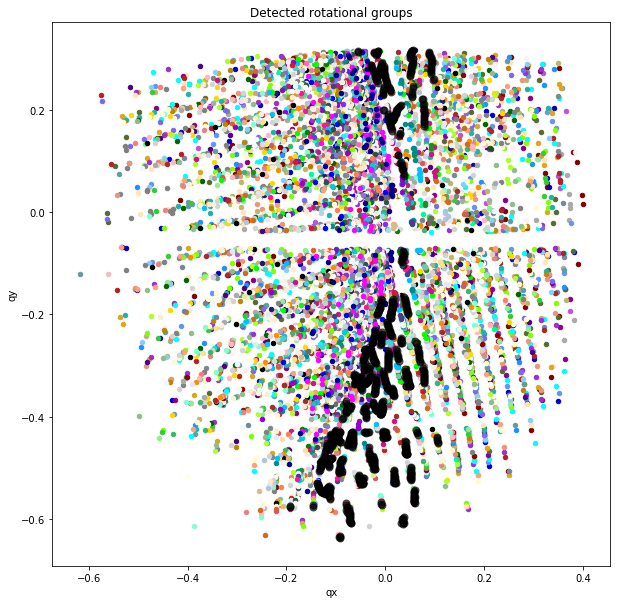

In [14]:
%matplotlib inline
plt.figure(figsize=(10, 10))
color_list = list(colors.CSS4_COLORS.values())[:len(qs_list)]
np.random.shuffle(color_list)
for frame_qs, color in zip(qs_list, color_list):
    plt.scatter(frame_qs.scat_vec[:, 0], frame_qs.scat_vec[:, 1], 20, color)
for group in groups.groups:
    streaks = np.concatenate(group.streaks)
    plt.scatter(streaks[:, 0], streaks[:, 1], 50, 'black', alpha=0.6)
plt.title('Detected rotational groups')
plt.xlabel('qx')
plt.ylabel('qy')
plt.show()

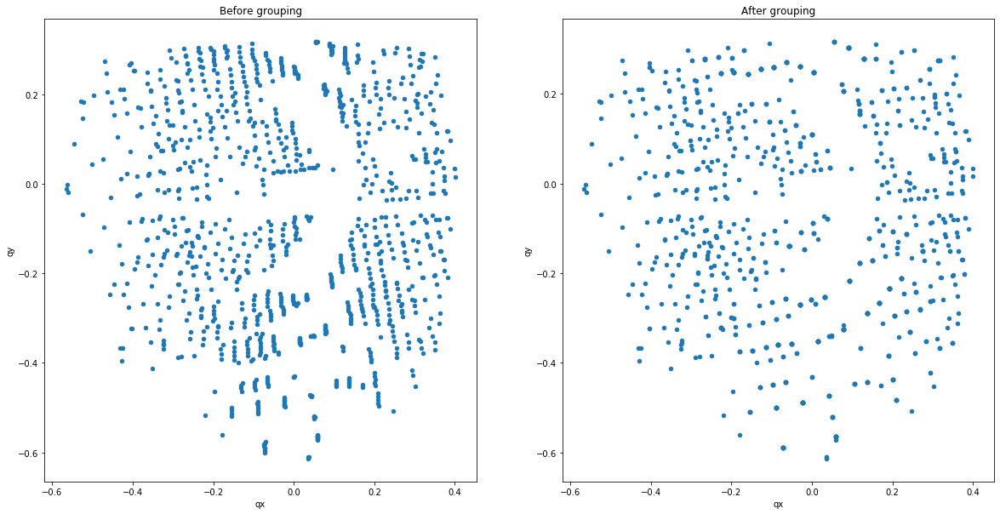

In [227]:
%matplotlib inline
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].scatter(rec_vec.scat_vec[:, 0], rec_vec.scat_vec[:, 1], 20)
axes[0].set_title('Before grouping')
axes[1].scatter(ref_vec.scat_vec[:, 0], ref_vec.scat_vec[:, 1], 20)
axes[1].set_title('After grouping')
for ax in axes:
    ax.set_xlabel('qx')
    ax.set_ylabel('qy')
plt.show()

# Gradien descend

In [4]:
b12_scan = pickle.load(open('exp_results/b12_scan.p', 'rb'))
b12_qs = b12_scan.kout_ref(np.radians(np.arange(101)))
basis_full = b12_qs.index()
rec_basis_full = cbc.rec_basis(basis_full)

In [5]:
frame_idx = 0
qs_frame = b12_scan[frame_idx].kout_streaks(0)
rot_m = b12_exp.rotation_matrix(-np.radians(frame_idx))
rec_basis = rec_basis_full.dot(rot_m.T)
basis_sizes = np.sqrt((rec_basis**2).sum(axis=-1))
inv_basis = np.linalg.inv(rec_basis)

NA = np.radians([0.74, 1.6])
box_size = 2 * np.ceil(np.abs(np.array([NA[0], NA[1], NA.max()**2 / 2]).dot(inv_basis)))

h_vals = np.arange(0, box_size[0])
k_vals = np.arange(0, box_size[1])
l_vals = np.arange(0, box_size[2])
h_grid, k_grid, l_grid = np.meshgrid(h_vals, k_vals, l_vals)
hkl_box = np.stack((h_grid.ravel(), k_grid.ravel(), l_grid.ravel()), axis=-1)

hkl_origin = np.floor(qs_frame.scat_vec.mean(axis=1).dot(inv_basis)) - np.ones(3) * (box_size - 2) // 2
hkl_idxs = hkl_origin[:, None] + hkl_box[None]

box_size, hkl_box.shape

(array([2., 2., 2.]), (8, 3))

In [6]:
rec_vec = hkl_idxs.dot(rec_basis)
rec_abs = ma.sqrt((rec_vec**2).sum(axis=-1))
rec_th = ma.arccos(-rec_vec[..., 2] / rec_abs)
rec_phi = np.arctan2(rec_vec[..., 1], rec_vec[..., 0])
source = ma.stack((-np.sin(rec_th - np.arccos(rec_abs / 2)) * np.cos(rec_phi),
                   -np.sin(rec_th - np.arccos(rec_abs / 2)) * np.sin(rec_phi),
                   np.cos(rec_th - np.arccos(rec_abs / 2))), axis=-1)


bounds = np.array([[[NA[0], 0], [-NA[0], 0], [0, NA[1]], [0, -NA[1]]]])
sol_m = np.array([[[0, 1], [0, 1], [1, 0], [1, 0]]])

coeff1 = (source * rec_vec).sum(axis=-1)[..., None] - (bounds * rec_vec[..., None, :2]).sum(axis=-1)
coeff2 = np.ma.stack((rec_vec[..., 1], rec_vec[..., 1], rec_vec[..., 0], rec_vec[..., 0]), axis=-1)
alpha = coeff2**2 + rec_vec[..., None, 2]**2
betta = coeff2 * coeff1
gamma = coeff1**2 - rec_vec[..., None, 2]**2 * (1 - bounds.sum(axis=-1)**2)
delta = betta**2 - alpha * gamma

solution = np.ma.concatenate((bounds + sol_m * ((betta + np.ma.sqrt(delta)) / alpha)[..., None],
                              bounds + sol_m * ((betta - np.ma.sqrt(delta)) / alpha)[..., None]), axis=-2)

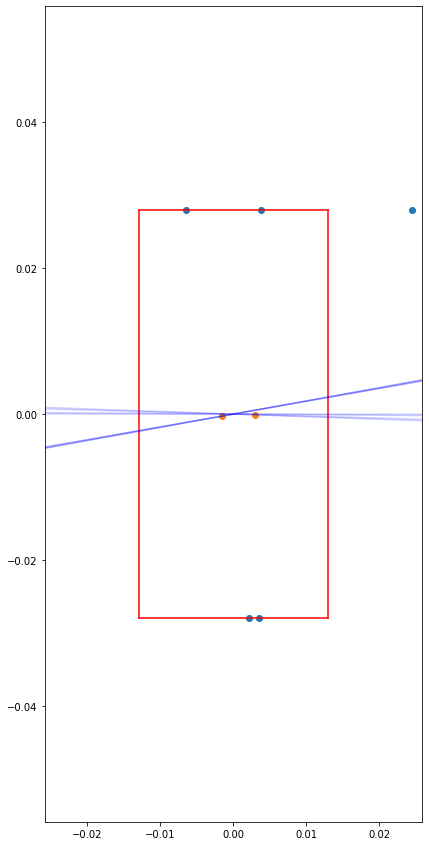

In [7]:
%matplotlib inline
NA_diag = np.sqrt(NA[0]**2 + NA[1]**2)
idx = 7
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111)
ax.scatter(solution[idx, ..., 0], solution[idx, ..., 1])
ax.plot(NA[0] * np.ones(50), np.linspace(-NA[1], NA[1]), 'r')
ax.plot(-NA[0] * np.ones(50), np.linspace(-NA[1], NA[1]), 'r')
ax.plot(np.linspace(-NA[0], NA[0]), NA[1] * np.ones(50), 'r')
ax.plot(np.linspace(-NA[0], NA[0]), -NA[1] * np.ones(50), 'r')
ax.plot(2 * np.linspace(-NA_diag, NA_diag)[:, None] * np.cos(rec_phi[idx]),
        2 * np.linspace(-NA_diag, NA_diag)[:, None] * np.sin(rec_phi[idx]), 'b', alpha=0.2)
ax.scatter(source[idx, :, 0], source[idx, :, 1])
ax.set_xlim(-2 * NA[0], 2 * NA[0])
ax.set_ylim(-2 * NA[1], 2 * NA[1])
ax.set_aspect('equal')
plt.show()

In [8]:
na_size = np.sqrt((NA**2).sum())
norm = rec_vec[:, :, None] - qs_frame.kout[:, None]
norm_grid = np.abs(1 - np.sqrt((norm**2).sum(axis=-1))).sum(axis=-1)

penalty_x = ma.where(np.abs(solution[..., 0]) > NA[0], np.abs(solution[..., 0]) - NA[0], 0)
penalty_y = ma.where(np.abs(solution[..., 1]) > NA[1], np.abs(solution[..., 1]) - NA[1], 0)
penalty = (penalty_x + penalty_y).min(axis=-1)

tf_grid = norm_grid
tf_vals = np.min(tf_grid, axis=1)
tf_val = np.mean(tf_vals)
idxs = (np.arange(rec_vec.shape[0]), np.argmin(tf_grid, axis=1))
index_vec = rec_vec[idxs]
index_lines = ma.stack((qs_frame.scat_vec.mean(axis=1), index_vec), axis=1)
tf_val

0.010275873012894465

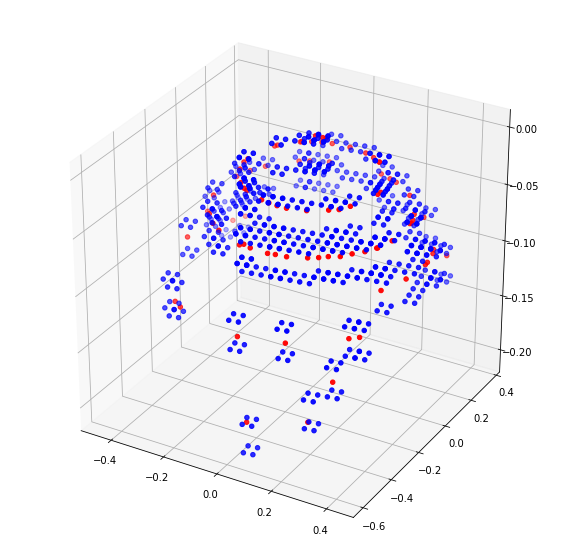

In [9]:
%matplotlib inline
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(qs_frame.scat_vec.mean(axis=1)[..., 0],
           qs_frame.scat_vec.mean(axis=1)[..., 1],
           qs_frame.scat_vec.mean(axis=1)[..., 2], c='r')
ax.scatter(rec_vec[..., 0],
           rec_vec[..., 1],
           rec_vec[..., 2], c='b')
plt.show()

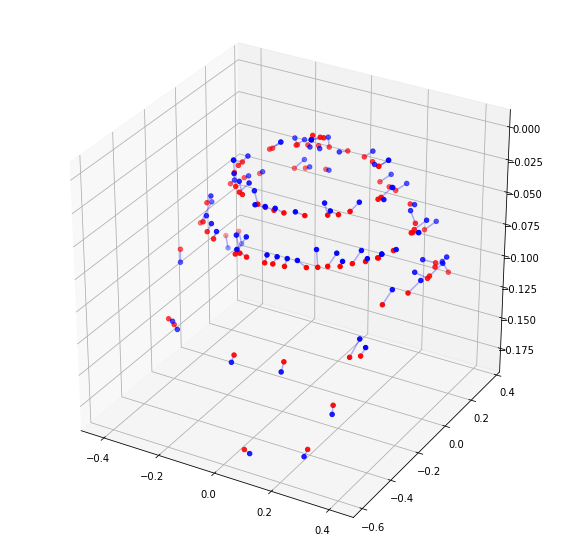

In [10]:
%matplotlib inline
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(qs_frame.scat_vec.mean(axis=1)[..., 0],
           qs_frame.scat_vec.mean(axis=1)[..., 1],
           qs_frame.scat_vec.mean(axis=1)[..., 2], c='r')
ax.scatter(index_vec[..., 0],
           index_vec[..., 1],
           index_vec[..., 2], c='b')
for line in index_lines:
    if not line.mask.any():
        ax.plot(line[..., 0], line[..., 1], line[..., 2], 'b', alpha=0.3)
plt.show()

In [5]:
%load_ext cython

In [6]:
%%cython
from cython cimport boundscheck, wraparound, cdivision
import numpy as np
cimport numpy as cnp
from libc.math cimport sqrt

ctypedef cnp.float64_t float_t
ctypedef cnp.int64_t int_t

@boundscheck(False)
@wraparound(False)
def fitness(float_t[:, :, ::1] index_vec,
            float_t[:, :, ::1] kout_exp,
            float_t[:, ::1] scat_exp,
            float_t num_ap_x,
            float_t num_ap_y):
    """
    Return target function fitness value for a given point

    index_vec - IndexLattice class object reciprocal vectors
    kout - experimental outcoming wavevectors
    """
    cdef:
        int a = index_vec.shape[0], b = index_vec.shape[1], i, j
        float_t norm_abs_0, norm_abs_1, pt_fit, min_fit, fitness = 0.0
        float_t dist_x, dist_y
    for i in range(a):
        norm_abs_0 = sqrt((index_vec[i, 0, 0] - kout_exp[i, 0, 0])**2 +
                          (index_vec[i, 0, 1] - kout_exp[i, 0, 1])**2 +
                          (index_vec[i, 0, 2] - kout_exp[i, 0, 2])**2)
        norm_abs_1 = sqrt((index_vec[i, 0, 0] - kout_exp[i, 1, 0])**2 +
                          (index_vec[i, 0, 1] - kout_exp[i, 1, 1])**2 +
                          (index_vec[i, 0, 2] - kout_exp[i, 1, 2])**2)
        min_fit = abs(1 - norm_abs_0) + abs(1 - norm_abs_1)
        dist_x = abs(index_vec[i, 0, 0] - scat_exp[i, 0])
        dist_y = abs(index_vec[i, 0, 1] - scat_exp[i, 1])
        if dist_x > num_ap_x:
            min_fit += 10 * (dist_x - num_ap_x)
        if dist_y > num_ap_y:
            min_fit += 10 * (dist_y - num_ap_y)
        for j in range(1, b):
            norm_abs_0 = sqrt((index_vec[i, j, 0] - kout_exp[i, 0, 0])**2 +
                              (index_vec[i, j, 1] - kout_exp[i, 0, 1])**2 +
                              (index_vec[i, j, 2] - kout_exp[i, 0, 2])**2)
            norm_abs_1 = sqrt((index_vec[i, j, 0] - kout_exp[i, 1, 0])**2 +
                              (index_vec[i, j, 1] - kout_exp[i, 1, 1])**2 +
                              (index_vec[i, j, 2] - kout_exp[i, 1, 2])**2)
            pt_fit = abs(1 - norm_abs_0) + abs(1 - norm_abs_1)
            dist_x = abs(index_vec[i, j, 0] - scat_exp[i, 0])
            dist_y = abs(index_vec[i, j, 1] - scat_exp[i, 1])
            if dist_x > num_ap_x:
                pt_fit += 10 * (dist_x - num_ap_x)
            if dist_y > num_ap_y:
                pt_fit += 10 * (dist_y - num_ap_y)
            if pt_fit < min_fit:
                min_fit = pt_fit
        fitness += min_fit
    return fitness / a

In [7]:
from math import sqrt, atan, atan2, cos, sin

class QIndexTF():
    """
    Indexing solution target function class based on scattering vectors error

    data - experimental data
    step_size - step size in numerical derivation

    Point is a flattened array of basis vectors lengths and orientation matrix
    """
    mat_shape = (3, 3)
    pix_size = 75 * 1e-3
    
    def __init__(self, data, num_ap):
        self.data, self.num_ap = data, num_ap
        self.na_size = np.sqrt((num_ap**2).sum())

    @property
    def kin(self):
        return np.tile(np.array([0, 0, 1]), (self.data.shape[0], 2, 1))

    def rec_vec(self, point):
        """
        Return outcoming wavevectors array of the examined frame
        """
        pts = self.data * self.pix_size - point[:2]
        phis = np.arctan2(pts[..., 1], pts[..., 0])
        thetas = np.arctan(np.sqrt(pts[..., 1]**2 + pts[..., 0]**2) / point[2])
        kout = np.stack((np.sin(thetas) * np.cos(phis),
                         np.sin(thetas) * np.sin(phis),
                         np.cos(thetas)), axis=-1)
        return cbc_dp.RecVectors(kout=kout,
                                 kin=self.kin)
   
    def rec_basis(self, point):
        """
        Return rectangular lattice basis vectors based on the point
        """
        return np.cos(point[6:]).reshape(self.mat_shape) * point[3:6][:, None]
  
    
    def tf_grid(self, point):
        rec_vec = self.rec_vec(point)
        index_lat = cbc_dp.IndexLattice(rec_basis=self.rec_basis(point),
                                        exp_vec=rec_vec.scat_vec.mean(axis=1),
                                        num_ap=self.num_ap)
        norm = index_lat.rec_vec[:, :, None] - rec_vec.kout[:, None]
        norm_grid = np.abs(1 - np.sqrt((norm**2).sum(axis=-1))).sum(axis=-1)
#         return norm_grid

        dist_x = ma.where(np.abs(index_lat.exp_vec[..., None, 0] - index_lat.rec_vec[..., 0]) > self.num_ap[0],
                          np.abs(index_lat.exp_vec[..., None, 0] - index_lat.rec_vec[..., 0]) - self.num_ap[0],
                          0)
        dist_y = ma.where(np.abs(index_lat.exp_vec[..., None, 1] - index_lat.rec_vec[..., 1]) > self.num_ap[1],
                          np.abs(index_lat.exp_vec[..., None, 1] - index_lat.rec_vec[..., 1]) - self.num_ap[1],
                          0)

#         pen_x = ma.where(np.abs(index_lat.source_lines[..., 0]) > self.num_ap[0],
#                          np.abs(index_lat.source_lines[..., 0]) - self.num_ap[0],
#                          0)
#         pen_y = ma.where(np.abs(index_lat.source_lines[..., 1]) > self.num_ap[1],
#                          np.abs(index_lat.source_lines[..., 1]) - self.num_ap[1],
#                          0)

        return norm_grid + 1e1 * (dist_x + dist_y)
        
    def values(self, point):
        """
        Return target function value array for a given point
        """
        return self.tf_grid(point).min(axis=-1)
    
    def idxs(self, point):
        return (np.arange(self.data.shape[0]), np.argmin(self.tf_grid(point), axis=1))
    
    def __call__(self, point):
        return np.mean(self.values(point))

class RotTF(QIndexTF):
    """
    Indexing solution target function class based on scattering vectors error
    with orthogonal basis vectors implied

    data - experimental data
    step_size - step size in numerical derivation

    Point is a flattened array of basis vectors lengths and euler angles [phi1, Phi, phi2]
    Euler angles with Bunge convention are used
    """
    def __init__(self, data, num_ap, rec_basis):
        super(RotTF, self).__init__(data, num_ap)
        self.ref_basis = rec_basis
        
    def rec_basis(self, point):
        """
        Return orthogonal orientation matrix based on euler angles
        """
        return self.ref_basis.dot(cbc_dp.utils.euler_matrix(point[3], point[4], point[5]).T)

In [8]:
import numba as nb
from math import sqrt, atan, atan2, cos, sin

class FullTF2():
    """
    Indexing solution target function class based on scattering vectors error

    data - experimental data
    step_size - step size in numerical derivation

    Point is a flattened array of basis vectors lengths and orientation matrix
    """
    mat_shape = (3, 3)
    pix_size = 75 * 1e-3
    
    def __init__(self, lines, num_ap):
        self.lines, self.num_ap = lines, num_ap
        self.na_size = np.sqrt((num_ap**2).sum())

    @property
    def kin(self):
        return np.tile(np.array([0, 0, 1]), (self.lines.shape[0], 2, 1))

    def exp_vec(self, point):
        """
        Return outcoming wavevectors array of the examined frame
        """
        kout = cbc_dp.utils.kout(self.lines, point, self.pix_size)
        return cbc_dp.RecVectors(kout=kout,
                                 kin=self.kin)
   
    def rec_basis(self, point):
        """
        Return rectangular lattice basis vectors based on the point
        """
        return np.cos(point[6:]).reshape(self.mat_shape) * point[3:6][:, None]
    
    def idxs(self, point):
        exp_vec = self.exp_vec(point)
        index_lat = cbc_dp.IndexLattice(rec_basis=self.rec_basis(point),
                                        exp_vec=exp_vec.scat_vec.mean(axis=1),
                                        num_ap=self.num_ap)
        return cbc_dp.utils.fitness_idxs(index_lat.rec_vec, exp_vec.kout)
    
    def __call__(self, point):
        exp_vec = self.exp_vec(point)
        index_lat = cbc_dp.IndexLattice(rec_basis=self.rec_basis(point),
                                        exp_vec=exp_vec.scat_vec.mean(axis=1),
                                        num_ap=self.num_ap)
        return fitness(index_lat.rec_vec, exp_vec.kout, index_lat.exp_vec, self.num_ap[0], self.num_ap[1])
#         return cbc_dp.utils.fitness(index_lat.rec_vec, exp_vec.kout)

class RotTF2(FullTF2):
    """
    Indexing solution target function class based on scattering vectors error
    with orthogonal basis vectors implied

    data - experimental data
    step_size - step size in numerical derivation

    Point is a flattened array of basis vectors lengths and euler angles [phi1, Phi, phi2]
    Euler angles with Bunge convention are used
    """
    def __init__(self, data, num_ap, rec_basis):
        super(RotTF2, self).__init__(data, num_ap)
        self.ref_basis = rec_basis

    def rec_basis(self, point):
        """
        Return orthogonal orientation matrix based on euler angles
        """
        return self.ref_basis.dot(cbc_dp.utils.euler_matrix(point[3], point[4], point[5]).T)
        
#     def rot_axis(self, point):
#         return np.array([np.sin(point[0]) * np.cos(point[1]),
#                          np.sin(point[0]) * np.sin(point[1]),
#                          np.cos(point[0])])
        
#     def rec_basis(self, point):
#         """
#         Return orthogonal orientation matrix based on euler angles
#         """
#         return self.ref_basis.dot(cbc_dp.utils.rotation_matrix(self.rot_axis(point), point[2]).T)

In [71]:
frame_idx = 0
rec_basis = rec_basis_full.dot(b12_exp.rotation_matrix(-np.radians(frame_idx)).T)
start_point = np.concatenate((b12_det_pos, np.zeros(3)))
q_tf = RotTF(data=b12_scan[frame_idx].raw_lines,
             num_ap=pupil_size,
             rec_basis=rec_basis)
q_tf2 = RotTF2(data=b12_scan[frame_idx].raw_lines,
               num_ap=pupil_size,
               rec_basis=rec_basis)
start_point = np.concatenate((b12_det_pos, np.zeros(3)))

q_tf(start_point), q_tf2(start_point)

(0.015405318986822411, 0.015405318986822408)

In [192]:
frame_idx = 21
rec_basis = rec_basis_full.dot(b12_exp.rotation_matrix(-np.radians(frame_idx)).T)
rec_sizes = np.sqrt((rec_basis**2).sum(axis=-1))
or_mat = np.arccos(rec_basis / rec_sizes[:, None]).ravel()
q_tf = cbc_dp.FullTF(lines=b12_scan[frame_idx].raw_lines,
                     num_ap=1.2 * pupil_size)
start_point = np.concatenate((b12_det_pos, rec_sizes, or_mat))

angle = 5
pos_bounds = np.stack((b12_det_pos * 0.95, b12_det_pos * 1.05), axis=-1)
size_bounds = np.stack((0.95 * b12_rec_sizes, 1.05 * b12_rec_sizes), axis=-1)
angle_bounds = np.stack((or_mat - np.radians(angle),
                         or_mat + np.radians(angle)), axis=-1)
bounds = np.concatenate((pos_bounds, size_bounds, angle_bounds))
bounds = [tuple(bound) for bound in bounds]

res = minimize(q_tf, start_point, bounds=bounds)
print(q_tf(res.x) / q_tf(start_point), res, sep='\n')

0.5470620955997629
      fun: 0.0021998057864776725
 hess_inv: <15x15 LbfgsInvHessProduct with dtype=float64>
      jac: array([-5.60523416e-05, -2.13119886e-05,  1.51293041e-05,  2.43434983e-02,
        7.55348991e-02,  1.61619333e-02,  3.10685679e-04, -1.72431600e-04,
        7.51108203e-04,  5.59409984e-04,  1.71211348e-03,  2.43280123e-03,
        9.95819009e-04, -1.73391640e-04,  5.35960165e-06])
  message: b'ABNORMAL_TERMINATION_IN_LNSRCH'
     nfev: 3072
      nit: 33
   status: 2
  success: False
        x: array([1.10250154e+02, 1.28250010e+02, 1.01975982e+02, 4.48722181e-02,
       3.28872879e-02, 2.90840091e-02, 1.73089799e+00, 1.71088232e-01,
       1.62953795e+00, 2.73310573e+00, 1.75519340e+00, 1.91509931e+00,
       2.03029439e+00, 1.63962846e+00, 4.62662514e-01])


In [19]:
frame_idx = 21
rec_basis = rec_basis_full.dot(b12_exp.rotation_matrix(-np.radians(frame_idx)).T)
rec_sizes = np.sqrt((rec_basis**2).sum(axis=-1))
or_mat = np.arccos(rec_basis / rec_sizes[:, None]).ravel()
start_point = np.concatenate((b12_det_pos, rec_sizes, or_mat))
q_tf = FullTF2(lines=b12_scan[frame_idx].raw_lines,
               num_ap=1.2 * pupil_size)

angle = 5
pos_bounds = np.stack((b12_det_pos * 0.95, b12_det_pos * 1.05), axis=-1)
size_bounds = np.stack((0.95 * b12_rec_sizes, 1.05 * b12_rec_sizes), axis=-1)
angle_bounds = np.stack((or_mat - np.radians(angle),
                         or_mat + np.radians(angle)), axis=-1)
bounds = np.concatenate((pos_bounds, size_bounds, angle_bounds))
bounds = [tuple(bound) for bound in bounds]

res = differential_evolution(q_tf, bounds, popsize=15, maxiter=1000)
print(q_tf(res.x) / q_tf(start_point), res, sep='\n')

KeyboardInterrupt: 

In [190]:
frame_idx = 21
rec_basis = rec_basis_full.dot(b12_exp.rotation_matrix(-np.radians(frame_idx)).T)
rec_sizes = np.sqrt((rec_basis**2).sum(axis=-1))
start_point = np.concatenate((b12_det_pos, np.zeros(3)))
q_tf = RotTF(data=b12_scan[frame_idx].raw_lines,
             num_ap=pupil_size,
             rec_basis=rec_basis)

angle = 5
pos_bounds = np.stack((b12_det_pos * 0.9, b12_det_pos * 1.1), axis=-1)
angle_bounds = np.array([[-np.radians(angle), np.radians(angle)],
                         [-np.radians(angle), np.radians(angle)],
                         [-np.radians(angle), np.radians(angle)]])
bounds = np.concatenate((pos_bounds, angle_bounds))
bounds = [tuple(bound) for bound in bounds]
res = minimize(q_tf, start_point, method='L-BFGS-B', bounds=bounds)
print(q_tf(res.x) / q_tf(start_point), res, sep='\n')

0.8020305829163453
      fun: 0.013567613186423069
 hess_inv: <6x6 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 5.94582196e-04,  2.83125433e-04,  6.66561771e-04, -1.05191290e-02,
        2.59668856e-02,  8.13418777e-05])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 203
      nit: 6
   status: 0
  success: True
        x: array([ 1.10253341e+02,  1.28246554e+02,  1.01977644e+02, -7.99948429e-02,
       -8.29243239e-02, -8.14158555e-02])


In [23]:
frame_idx = 21
rec_basis = rec_basis_full.dot(b12_exp.rotation_matrix(-np.radians(frame_idx)).T)
start_point = np.concatenate((b12_det_pos, np.zeros(3)))
q_tf = RotTF2(data=b12_scan[frame_idx].raw_lines,
                    num_ap=1.2 * pupil_size,
                    rec_basis=rec_basis)

angle = 15
pos_bounds = np.stack((b12_det_pos * 0.9, b12_det_pos * 1.1), axis=-1)
angle_bounds = np.array([[-np.radians(angle), np.radians(angle)],
                         [-np.radians(angle), np.radians(angle)],
                         [-np.radians(angle), np.radians(angle)]])
bounds = np.concatenate((pos_bounds, angle_bounds))
bounds = [tuple(bound) for bound in bounds]
res = differential_evolution(q_tf, bounds=bounds, popsize=25, maxiter=500, polish=True)
print(q_tf(res.x) / q_tf(start_point), res, sep='\n')

0.34448001481954277
     fun: 0.004612934668751147
     jac: array([-2.31157107e-05,  5.49649562e-04,  4.58824818e-05,  4.30215126e-03,
       -5.69880948e-04,  3.32008240e-03])
 message: 'Optimization terminated successfully.'
    nfev: 16239
     nit: 106
 success: True
       x: array([ 1.13996876e+02,  1.18816855e+02,  1.11773885e+02,  1.33936687e-01,
        1.08826652e-01, -2.54890890e-01])


In [29]:
det_pts = cbc_dp.IndexLattice(rec_basis=q_tf.rec_basis(start_point),
                              exp_vec=q_tf.exp_vec(start_point).scat_vec.mean(axis=1),
                              num_ap=q_tf.num_ap).det_pts(b12_exp)[q_tf.idxs(start_point)]
det_lines = cbc_dp.RectModel(q_tf.rec_basis(start_point), pupil_size, 0.7).det_lines(b12_exp)

In [24]:
res_exp = cbc_dp.ExperimentSettings(rot_axis, pix_size, res.x[:3], wavelength)
det_pts = cbc_dp.IndexLattice(rec_basis=q_tf.rec_basis(res.x),
                                exp_vec=q_tf.exp_vec(res.x).scat_vec.mean(axis=1),
                                num_ap=q_tf.num_ap).det_pts(res_exp)[q_tf.idxs(res.x)]
model_pts = cbc_dp.RectModel(q_tf.rec_basis(res.x), 1.2 * pupil_size, 0.7).det_pts(res_exp)
model_lines = cbc_dp.RectModel(q_tf.rec_basis(res.x), 1.2 * pupil_size, 0.7).det_lines(res_exp)

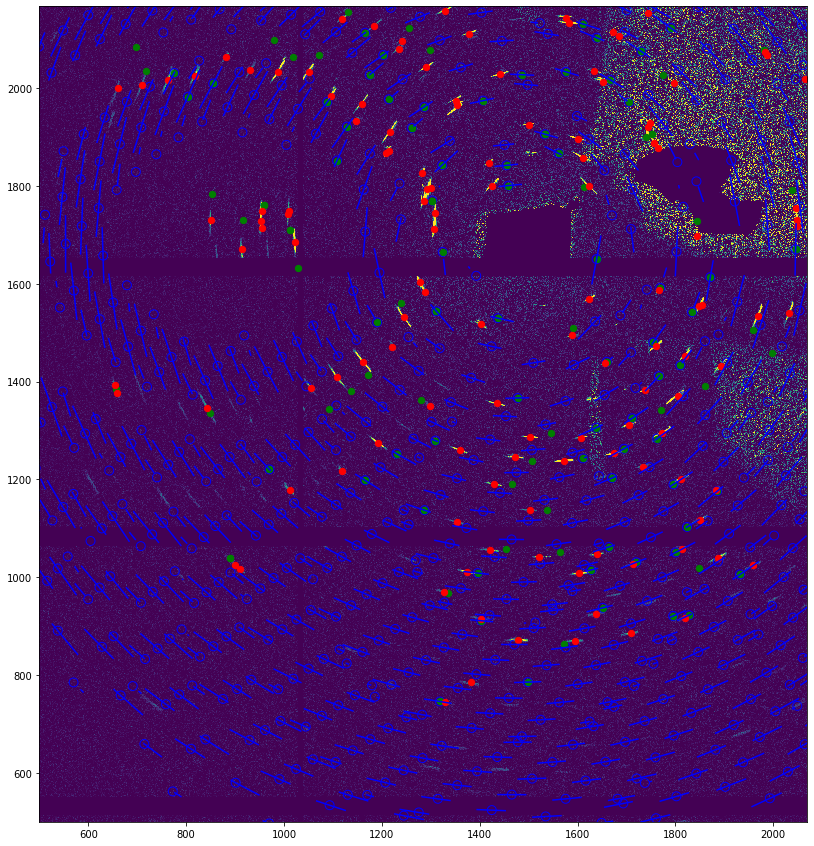

In [22]:
%matplotlib inline
exp_pts = b12_scan[frame_idx].raw_lines.mean(axis=1)
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
ax.imshow(b12_cor_data[frame_idx], vmin=0, vmax=50)
ax.scatter(model_pts[..., 0], model_pts[..., 1], s=80, facecolors='none', edgecolors='b')
for line in model_lines:
    ax.plot(line[..., 0], line[..., 1], 'b')
ax.scatter(det_pts[..., 0], det_pts[..., 1], 40, 'g')
ax.scatter(exp_pts[..., 0], exp_pts[..., 1], 40, 'r')
ax.set_xlim(500, 2070)
ax.set_ylim(500, 2167)
plt.show()

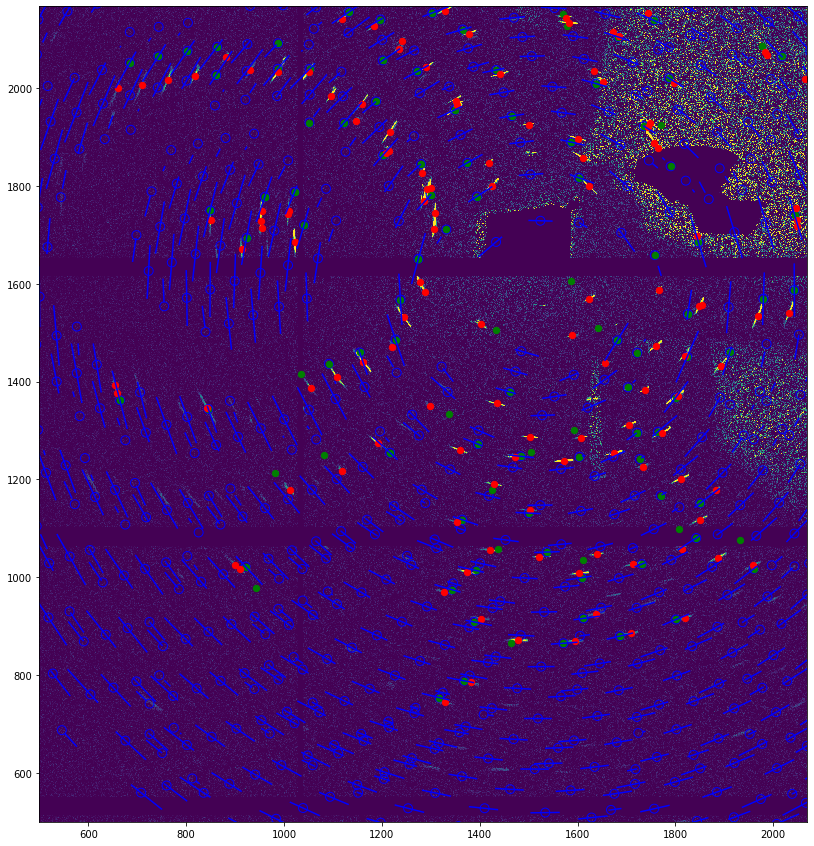

In [25]:
%matplotlib inline
exp_pts = b12_scan[frame_idx].raw_lines.mean(axis=1)
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
ax.imshow(b12_cor_data[frame_idx], vmin=0, vmax=50)
ax.scatter(model_pts[..., 0], model_pts[..., 1], s=80, facecolors='none', edgecolors='b')
for line in model_lines:
    ax.plot(line[..., 0], line[..., 1], 'b')
ax.scatter(det_pts[..., 0], det_pts[..., 1], 40, 'g')
ax.scatter(exp_pts[..., 0], exp_pts[..., 1], 40, 'r')
ax.set_xlim(500, 2070)
ax.set_ylim(500, 2167)
plt.show()

In [169]:
print(q_tf.rec_basis(res.x))
print(rec_basis_84)
print(np.sqrt((rec_basis_84**2).sum(axis=-1)), np.sqrt((q_tf.rec_basis(res.x)**2).sum(axis=-1)))

[[ 0.00032345  0.0457485  -0.00955931]
 [-0.0037662  -0.00698101 -0.03138012]
 [-0.02587434 -0.00106759  0.00054256]]
[[ 0.00160399  0.0068283   0.03260359]
 [-0.00251225  0.04630327 -0.00957389]
 [-0.02909785 -0.00122951  0.00168902]]
[0.03334955 0.04734938 0.02917275] [0.04673767 0.03236712 0.02590204]


In [155]:
basis_lines[0]

array([[ 0.        ,  0.00032345],
       [ 0.        ,  0.0457485 ],
       [ 0.        , -0.00955931]])

In [170]:
color1 = np.tile(np.array([1., 0., 0., 1.])[None, :], (3, 1))
color2 = np.tile(np.array([0., 1., 0., 1.])[None, :], (3, 1))
color3 = np.array([[1., 1., 1., 1.]])
color = np.concatenate((color1, color2, color3))
color

array([[1., 0., 0., 1.],
       [1., 0., 0., 1.],
       [1., 0., 0., 1.],
       [0., 1., 0., 1.],
       [0., 1., 0., 1.],
       [0., 1., 0., 1.],
       [1., 1., 1., 1.]])

In [171]:
%gui qt
app = cbc_dp.Qt.make_app()
w = cbc_dp.Qt.ScatterViewer()
w.set_data(pos=np.concatenate((q_tf.rec_basis(res.x), rec_basis_84, np.zeros((1, 3)))), color=color)
w.show()

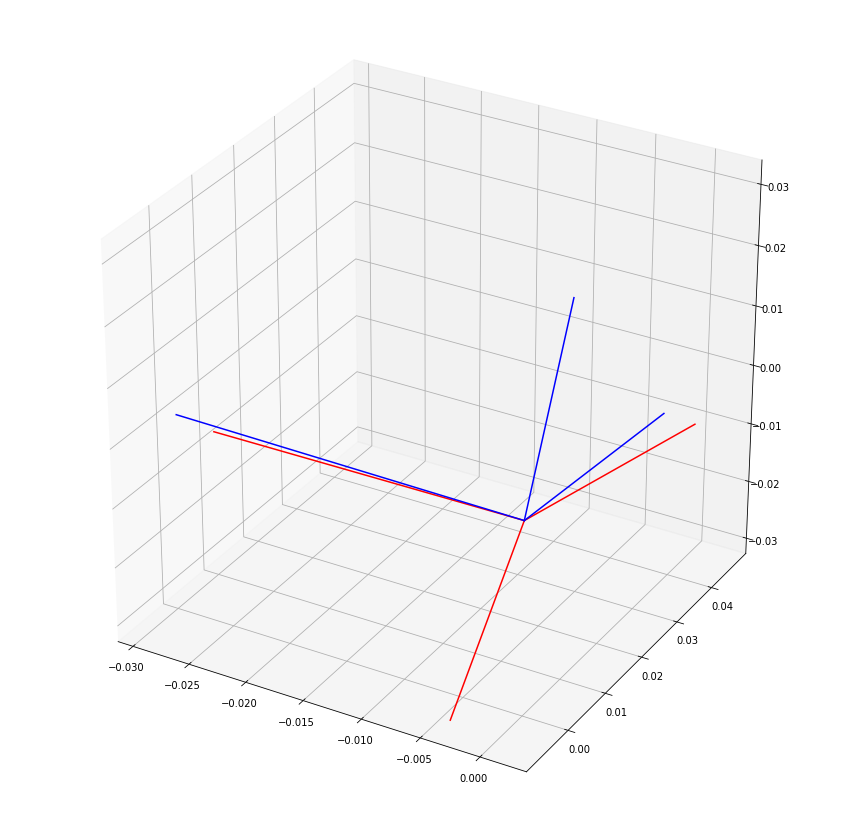

In [172]:
%matplotlib inline
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')
basis_lines = np.stack((np.zeros((3, 3)), q_tf.rec_basis(res.x)), axis=-1)
basis_lines2 = np.stack((np.zeros((3, 3)), rec_basis_84), axis=-1)
for line in basis_lines:
    ax.plot(line[0], line[1], line[2], 'r')
for line in basis_lines2:
    ax.plot(line[0], line[1], line[2], 'b')
plt.show()

In [182]:
def det_pts(k_out, exp_set):
    det_x = exp_set.det_pos[2] * np.tan(np.arccos(k_out[..., 2])) * np.cos(np.arctan2(k_out[..., 1], k_out[..., 0]))
    det_y = exp_set.det_pos[2] * np.tan(np.arccos(k_out[..., 2])) * np.sin(np.arctan2(k_out[..., 1], k_out[..., 0]))
    return (np.stack((det_x, det_y), axis=-1) + exp_set.det_pos[:2]) / exp_set.pix_size

In [187]:
rot_m_84 = np.array([[5.79613006e-02, -4.20576927e-02, -9.97432523e-01],
                         [-3.01210901e-04, 9.99111418e-01, -4.21459884e-02],
                         [9.98318785e-01, 2.74327385e-03, 5.78971290e-02]])
rec_basis_84 = np.array([[2.19929435e+07, -3.44464984e+07, -3.98973009e+08],
                         [9.36257179e+07, 6.34883857e+08, -1.68583954e+07],
                         [4.47041605e+08, -1.31271623e+08, 2.31588516e+07]]) * wavelength * 1e-3
rec_basis_84 = rec_basis_84.T
d_kout = np.array([4.997e-2, 1.171e-2, 0])
# d_kout = np.zeros(3)

mod_kout = cbc_dp.RectModel(rec_basis_84, 1.2 * pupil_size, 0.7).kout + d_kout
mod_kout_lines = cbc_dp.RectModel(rec_basis_84, 1.2 * pupil_size, 0.7).kout_lines() + d_kout
model_pts = det_pts(mod_kout, b12_exp)
model_lines = det_pts(mod_kout_lines, b12_exp)

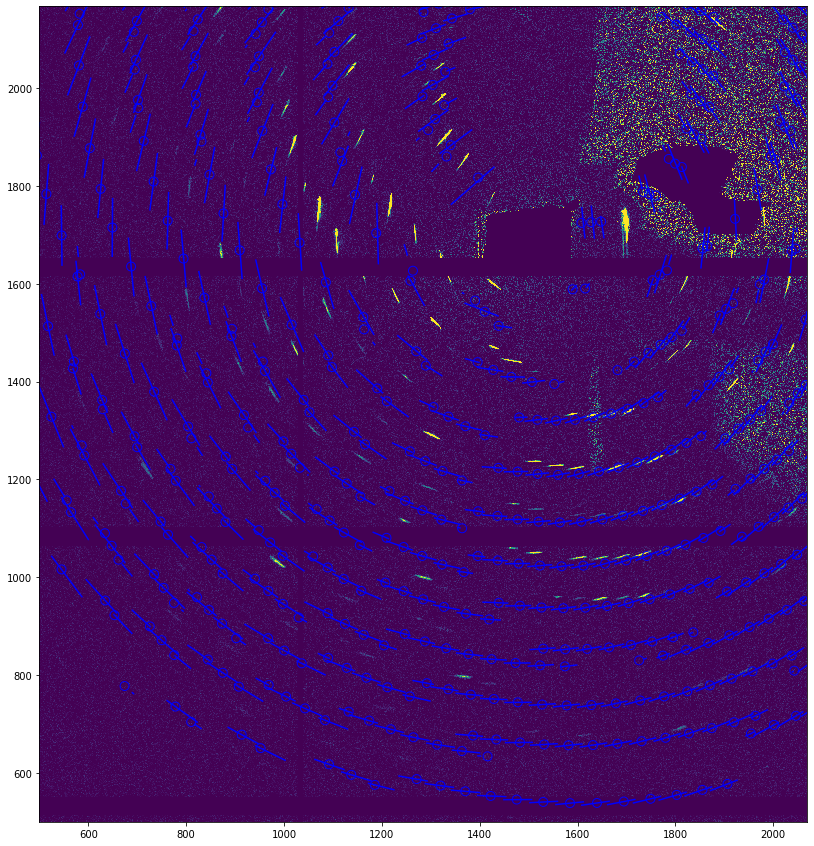

In [188]:
%matplotlib inline
exp_pts = b12_scan[frame_idx].raw_lines.mean(axis=1)
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
ax.imshow(b12_cor_data[frame_idx], vmin=0, vmax=50)
ax.scatter(model_pts[..., 0], model_pts[..., 1], s=80, facecolors='none', edgecolors='b')
for line in model_lines:
    ax.plot(line[..., 0], line[..., 1], 'b')
ax.set_xlim(500, 2070)
ax.set_ylim(500, 2167)
plt.show()

# Diffraction simulation

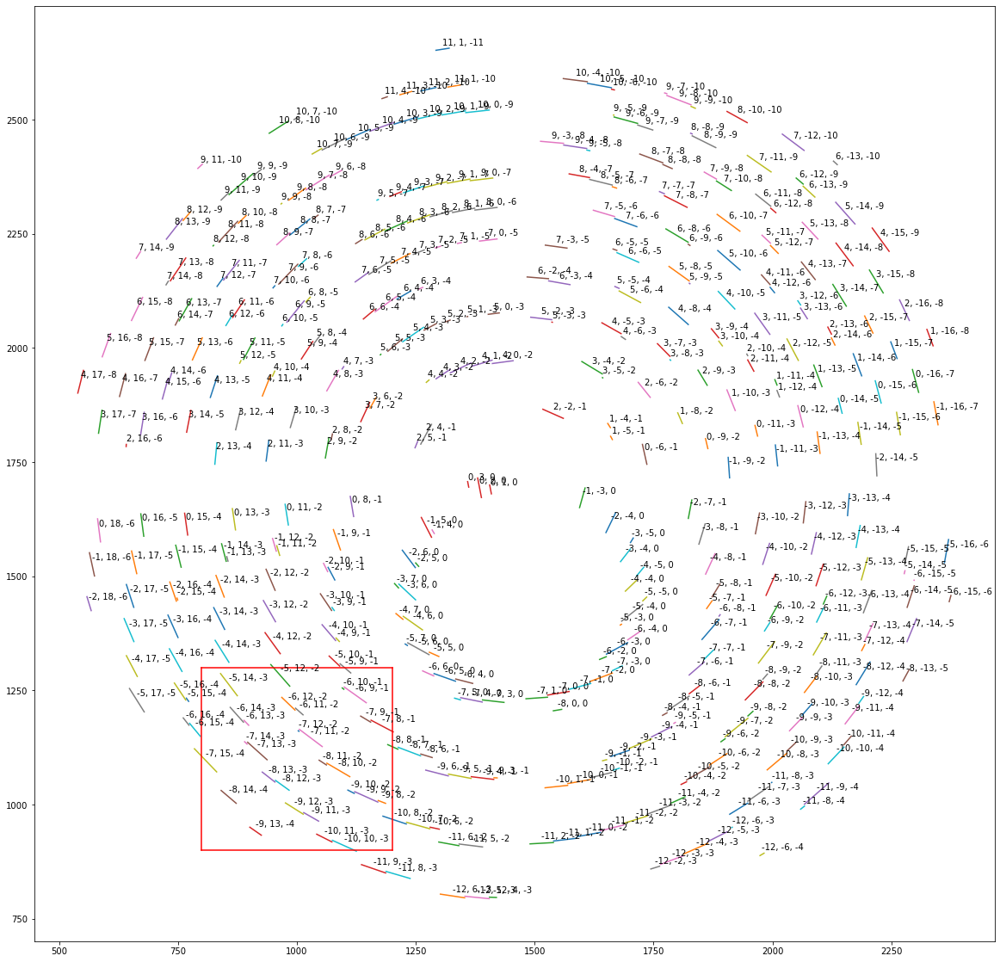

In [28]:
%matplotlib inline
rot_m = cbc_dp.utils.rotation_matrix([1, 0, 0], np.radians(10))
rec_lat = cbc_dp.RecLattice(rec_basis_full.dot(rot_m.T))
model = cbc_dp.SquareModel(rec_lat, np.radians(0.9), 0.6)
det_lines = model.det_pts(b12_exp)
hkl_idxs = model.hkl_idx.astype(np.int64)
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111)
for line, hkl_idx in zip(det_lines, hkl_idxs):
    ax.plot(line[:, 0], line[:, 1])
    ax.text(line[:, 0].mean(), line[:, 1].mean() + 10, '{0[0]:d}, {0[1]:d}, {0[2]:d}'.format(hkl_idx))
ax.plot(np.linspace(800, 1200), 900 * np.ones(50), 'r')
ax.plot(np.linspace(800, 1200), 1300 * np.ones(50), 'r')
ax.plot(800 * np.ones(50), np.linspace(900, 1300), 'r')
ax.plot(1200 * np.ones(50), np.linspace(900, 1300), 'r')
plt.show()

In [78]:
mod_scan = []
kins = []
for theta in np.radians(np.arange(101)):
    rot_m = b12_exp.rotation_matrix(-theta)
    or_rot = or_mat.dot(rot_m.T)
    rec_lat = cbc_dp.RecLattice(or_mat=or_rot, center=np.zeros(3))
    model = cbc_dp.CircModel(rec_lat=rec_lat, num_ap=np.radians(1.5), q_max=0.4)
    xs, ys = model.detector_pts(b12_dist)
    lines = np.stack((xs, ys), axis=2) / pix_size
    kin = np.mean((model.entry_pts(), model.exit_pts()), axis=0).T
    kins.append(kin.dot(rot_m))
    strks = cbc_dp.FrameStreaks(lines, np.zeros(2))
    mod_scan.append(strks)
mod_scan = cbc_dp.ScanStreaks(mod_scan)
kins = np.concatenate(kins)
mod_qs_ref = mod_scan.kout_ref(exp_set=b12_exp,
                               theta=np.radians(np.arange(101)),
                               pixels=35)
mod_qs_raw = mod_scan.kout(exp_set=b12_exp,
                           theta=np.radians(np.arange(101)))
mod_qs = cbc_dp.RecVectors(kout=mod_qs_raw.kout, kin=kins)
rec_lat = cbc_dp.RecLattice(or_mat, np.zeros(3))
qs_model = rec_lat.scat_vec(mod_qs.scat_vec)

In [46]:
%gui qt
app = cbc_dp.Qt.make_app()
w = cbc_dp.Qt.ScatterViewer()
w.set_data(pos=mod_qs.scat_vec, size=5)
w.show()

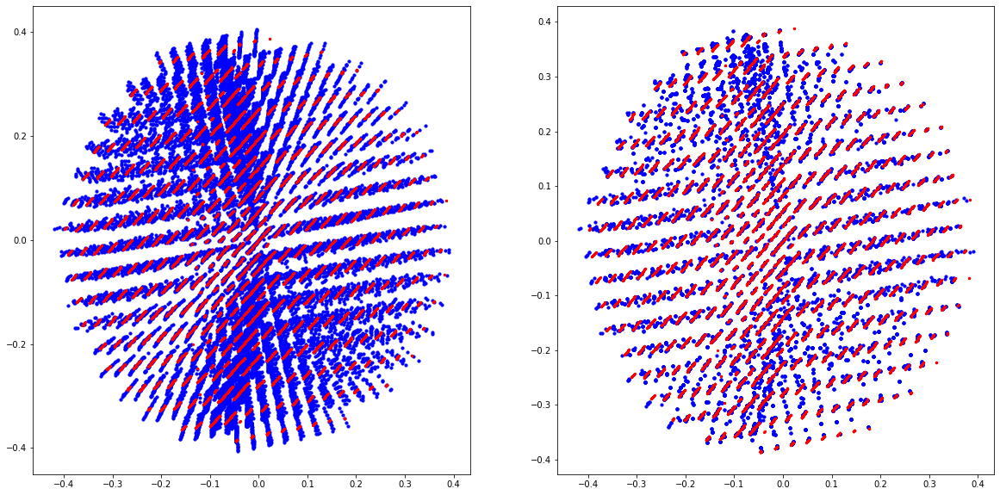

In [79]:
%matplotlib inline
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].scatter(mod_qs_raw.scat_vec[:, 0], mod_qs_raw.scat_vec[:, 1], 10, 'b')
axes[0].scatter(qs_model[:, 0], qs_model[:, 1], 5, 'r')
axes[1].scatter(mod_qs_ref.scat_vec[:, 0], mod_qs_ref.scat_vec[:, 1], 10, 'b')
axes[1].scatter(qs_model[:, 0], qs_model[:, 1], 5, 'r')
plt.show()

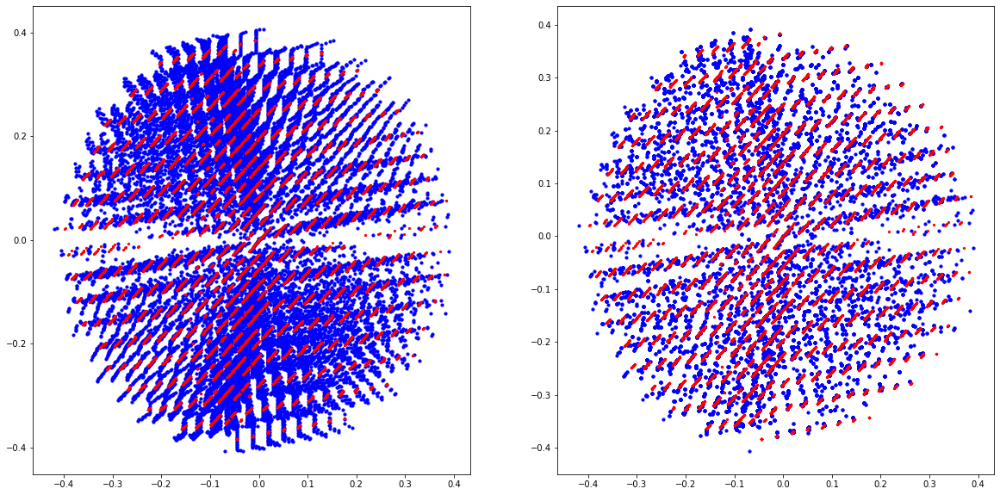

In [93]:
%matplotlib inline
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].scatter(mod_qs_raw.scat_vec[:, 0], mod_qs_raw.scat_vec[:, 1], 10, 'b')
axes[0].scatter(qs_model[:, 0], qs_model[:, 1], 5, 'r')
axes[1].scatter(mod_qs_ref.scat_vec[:, 0], mod_qs_ref.scat_vec[:, 1], 10, 'b')
axes[1].scatter(qs_model[:, 0], qs_model[:, 1], 5, 'r')
plt.show()

In [65]:
def rec_or(axes):
    """
    Return orientation matrix based on unit cell primitive vectors matrix

    axes - unit cell primitive vectors matrix
    """
    a_rec, b_rec, c_rec = cbc.rec_basis(axes[0], axes[1], axes[2])
    return np.stack((a_rec, b_rec, c_rec))

In [85]:
size = 100
gauss_sigma = 4
threshold = 3
fft_grid = mod_qs_ref.fft(size)
fft_blur = gaussian_filter(fft_grid.astype(np.float64), gauss_sigma)
peak_mask = fft_blur > fft_blur.mean() + threshold * fft_blur.std()
peak_labels, peak_num = label(peak_mask)
peak_centers = np.array(maximum_position(fft_blur,
                                         labels=peak_labels,
                                         index=np.arange(1, peak_num + 1)))
peak_centers = peak_centers - size / 2 * np.ones(3)
axes_mask = np.array([center.dot(center) for center in peak_centers]).argsort()[:11]
centers = (peak_centers * mod_qs_ref.range**-1)[axes_mask]
axes = centers[[1, 3, 9]]

In [86]:
mod_or = rec_or(axes)
mod_or, or_mat

(array([[-0.00928437,  0.04533879,  0.00148683],
        [-0.03122388, -0.00544065, -0.00017842],
        [ 0.00171495,  0.00181355, -0.02616825]]),
 array([[-0.00955958,  0.04569071,  0.00127158],
        [-0.03160975, -0.00589558, -0.00016407],
        [-0.00153314, -0.00164234,  0.02641596]]))

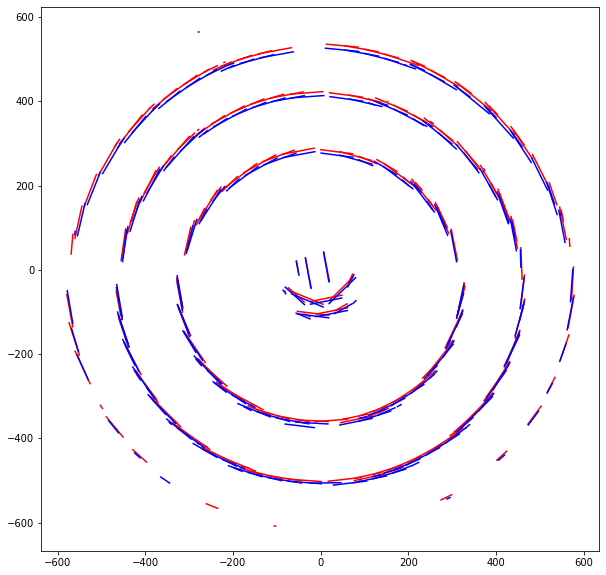

In [91]:
%matplotlib inline
rec_lat = cbc_dp.RecLattice(or_mat=mod_or, center=np.zeros(3))
model = cbc_dp.SquareModel(rec_lat=rec_lat, num_ap=np.radians(1.5), q_max=0.4)
xs, ys = model.detector_pts(b12_dist)
plt.figure(figsize=(10, 10))
for line in mod_scan[0].lines:
    plt.plot(line[:, 0], line[:, 1], 'r')
for x, y in zip(xs, ys):
    plt.plot(x / pix_size, y / pix_size, 'b')
plt.show()

# Peaks sum

In [31]:
lyssum = np.concatenate([lines for lines in lyslines if lines.any()]).mean(axis=1)
b12sum = np.concatenate([lines for lines in b12lines if lines.any()]).mean(axis=1)
lyssumints = np.concatenate([ints for ints in lysints if ints.any()])
b12sumints = np.concatenate([ints for ints in b12ints if ints.any()])

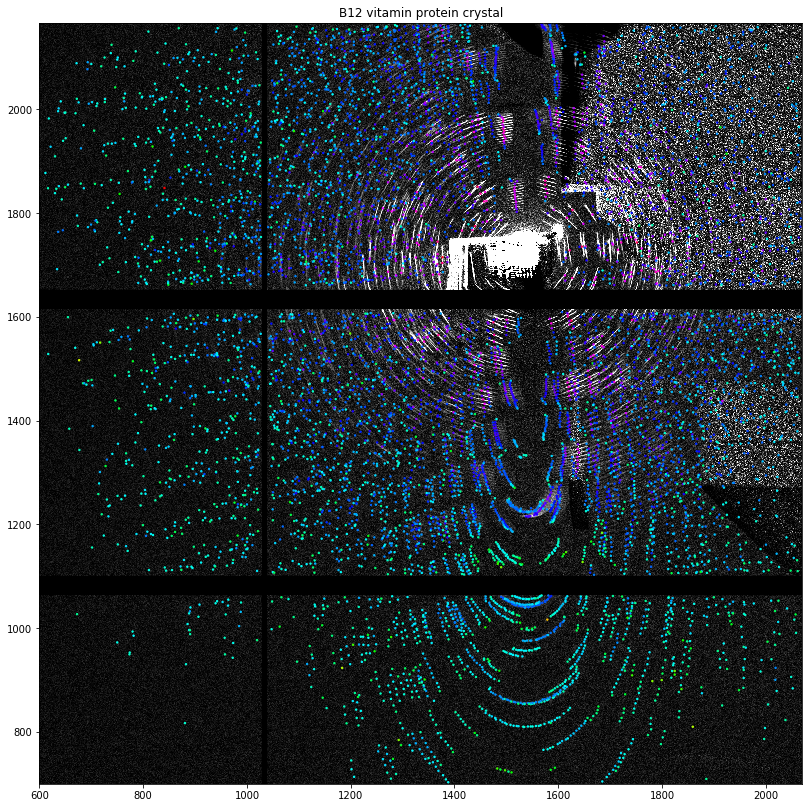

In [32]:
%matplotlib inline
plt.figure(figsize=(14, 14))
plt.imshow(b12data.sum(axis=0), vmin=0, vmax=3000, cmap='gist_gray')
plt.scatter(b12sum[:, 0], b12sum[:, 1], s=2, c=np.log(b12sumints - b12sumints.min() + 1.0), cmap='hsv')
plt.xlim((b12roi.roi[2], b12roi.roi[3]))
plt.ylim((b12roi.roi[0], b12roi.roi[1]))
plt.title('B12 vitamin protein crystal')
plt.show()

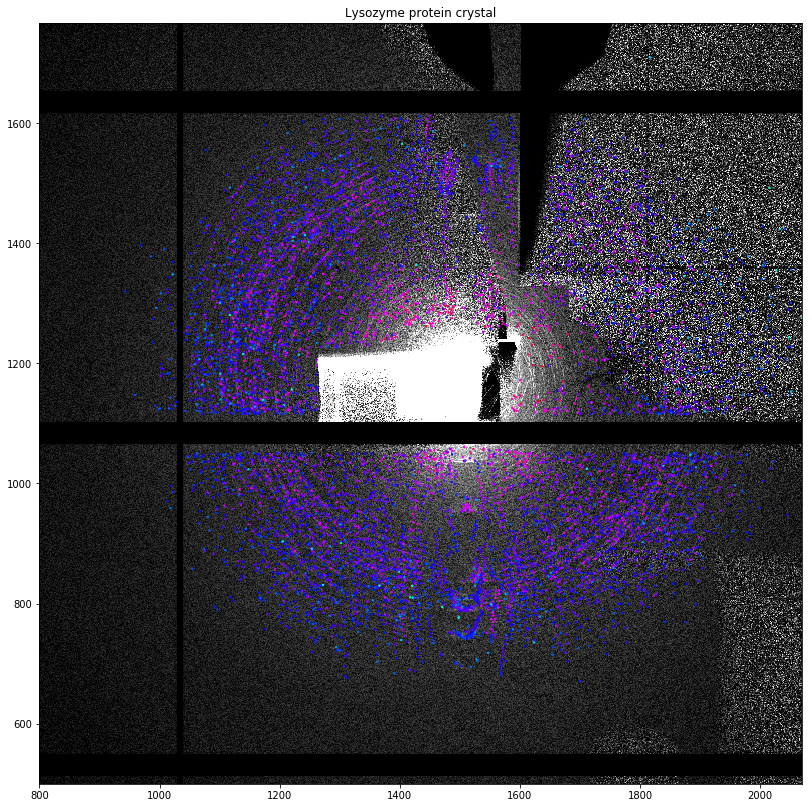

In [86]:
%matplotlib inline
plt.figure(figsize=(14, 14))
plt.imshow(lysdata.sum(axis=0), vmin=100, vmax=3000, cmap='gist_gray')
plt.scatter(lyssum[:, 0], lyssum[:, 1], s=2, c=np.log(lyssumints - lyssumints.min() + 1.0), cmap='hsv')
plt.xlim((lysroi.roi[2], lysroi.roi[3]))
plt.ylim((lysroi.roi[0], lysroi.roi[1]))
plt.title('Lysozyme protein crystal')
plt.show()